In [1]:
import pandas as pd
import numpy as np
from sklearn.neighbors import KernelDensity
import seaborn as sns
import matplotlib.pyplot as plt

In [130]:
df = pd.read_csv('dataset/gas_turbine_fault_detection.csv')

In [131]:
df = df[df['Fault'] != 1]
df.drop('Fault', axis=1, inplace=True)

In [132]:
X = []
for sample in df.values:
    X.append(sample)

In [133]:
model = KernelDensity()
model.fit(X)

KernelDensity()

In [ ]:
FAULT_MODES = ['MECANICA_COJINETES', 'ENFRIAMIENTO_PRESION', 'CONTROL_COMBUSTIBLE']
N_TURBINAS = 1000
L_CICLO = 100
UMBRAL_DETERIORO = 50 #a partir de la iteracion 50 empieza a deteriorarse, y a partir de la 30 empieza a fallar
UMBRAL_FALLA = 30
FACTOR_K_POTENCIA = 0.00015
TASA_DEGR = 0.05

# Coeficientes de Degradación (Tasa de cambio por ciclo en el modo deterioro)
COEF_DEGRADACION = {
    'Vibrations (mm/s)': 0.03,  # Deterioro mecánico 
    'Oil Temperature (°C)': 0.1, # Deterioro de lubricación
    'Air Pressure (kPa)': -2.5, # Degradación de presión (enfriamiento)
    'Temperature (°C)': 1.5,    # Aumento de TIT por falta de enfriamiento
    'Fuel Flow Rate (kg/s)': 0.02 # Aumento por control defectuoso
}


In [135]:
fm = []
time = []
simulated_data = []

In [136]:
#indexes
#Temperature (°C) – 0
# RPM – 1
# Torque (Nm) – 2
# Vibrations (mm/s) – 3
# Power Output (MW) – 4
# Fuel Flow Rate (kg/s) – 5
# Air Pressure (kPa) – 6
# Exhaust Gas Temperature (°C) – 7
# Oil Temperature (°C) – 8
# Fault – 9

In [137]:
def to_dict(sample):
    cols = ['Temperature (°C)', 'RPM', 'Torque (Nm)', 'Vibrations (mm/s)', 'Power Output (MW)', 'Fuel Flow Rate (kg/s)', 'Air Pressure (kPa)', 'Exhaust Gas Temperature (°C)', 'Oil Temperature (°C)', 'Fault']
    result = {}
    i = 0
    for col in cols:
        result[col] = sample[i]
        i+=1
    return result

In [ ]:
def cycle_evol(last_sample, ttc, max_cycle, fail_mode):
    new_sample = model.sample()[0]
    new_sample = np.append(new_sample, 0)
    new_sample_r = to_dict(new_sample)

    actual_ttc = max_cycle - ttc

    if actual_ttc >= L_CICLO - UMBRAL_DETERIORO:
        RUIDO = np.random.normal(0, 0.02)

        # Aplicación de la Degradación Específica del Modo de Falla
        if fail_mode == 'MECANICA_COJINETES':
            # Falla Mecánica Rápida (Oil Temp y Vibrations - PDF Pág. 29/30)
            
            # Aumento progresivo de la Vibración y Temp. de Aceite
            new_sample_r['Vibrations (mm/s)'] += (COEF_DEGRADACION['Vibrations (mm/s)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) 
            
            # Correlación: Temp. de Aceite sube por la fricción de la Vibración
            aumento_por_friccion = 5 * abs(new_sample_r['Vibrations (mm/s)'] - last_sample['Vibrations (mm/s)'])
            new_sample_r['Oil Temperature (°C)'] += (COEF_DEGRADACION['Oil Temperature (°C)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) + aumento_por_friccion

            # RPM y Torque pueden bajar ligeramente debido al aumento de la fricción interna
            new_sample_r['RPM'] -= np.random.normal(0, 10) + RUIDO
            new_sample_r['Torque (Nm)'] -= np.random.normal(0, 100) + RUIDO 
        
        elif fail_mode == 'ENFRIAMIENTO_PRESION':
            # Falla de Enfriamiento por Presión Baja (Air Pressure, TIT, EGT - PDF Pág. 28)
            
            # Caída progresiva de la Presión de Aire (compresor o fuga)
            new_sample_r['Air Pressure (kPa)'] += (COEF_DEGRADACION['Air Pressure (kPa)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO)
            
            # Correlación: TIT y EGT suben por la falta de aire de enfriamiento (TIT/EGT deben subir juntas)
            aumento_por_calor = 0.5 * (COEF_DEGRADACION['Air Pressure (kPa)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) * -1
            new_sample_r['Temperature (°C)'] += (COEF_DEGRADACION['Temperature (°C)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) + aumento_por_calor
            new_sample_r['Exhaust Gas Temperature (°C)'] += (COEF_DEGRADACION['Temperature (°C)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) * 0.8 + aumento_por_calor

            # Fuel Flow puede aumentar ligeramente para compensar la caída de rendimiento
            new_sample_r['Fuel Flow Rate (kg/s)'] += np.random.normal(0, 0.01) + RUIDO
        
        elif fail_mode == 'CONTROL_COMBUSTIBLE':
            # Falla de Lazo de Control (EGT y Fuel Flow Rate - PDF Pág. 30)
            
            # Aumento intencional (o falta de reducción) del Fuel Flow Rate
            new_sample_r['Fuel Flow Rate (kg/s)'] += (COEF_DEGRADACION['Fuel Flow Rate (kg/s)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO)
            
            # Correlación: El EGT y TIT suben como resultado del Fuel Flow Rate excesivo
            new_sample_r['Exhaust Gas Temperature (°C)'] += 2 * (COEF_DEGRADACION['Fuel Flow Rate (kg/s)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) * 10
            new_sample_r['Temperature (°C)'] += 3 * (COEF_DEGRADACION['Fuel Flow Rate (kg/s)'] * np.exp(TASA_DEGR * actual_ttc) + RUIDO) * 10

            # Torque y Power Output suben temporalmente debido a la energía extra
            new_sample_r['Torque (Nm)'] += np.random.normal(0, 150) + RUIDO
            new_sample_r['RPM'] += np.random.normal(0, 5) + RUIDO


    #falla en los ultimos 30 ciclos
    new_sample_r['Fault'] = 1 if actual_ttc >= L_CICLO - UMBRAL_FALLA else 0

    if new_sample_r['Fault'] == 1:
        if fail_mode == 'MECANICA_COJINETES':
            new_sample_r['Fault Mode'] = 1
        elif fail_mode == 'ENFRIAMIENTO_PRESION':
            new_sample_r['Fault Mode'] = 2
        elif fail_mode == 'CONTROL_COMBUSTIBLE':
            new_sample_r['Fault Mode'] = 3
    else:
        new_sample_r['Fault Mode'] = 0

    eficiencia = FACTOR_K_POTENCIA * (1 - (UMBRAL_DETERIORO - actual_ttc) / L_CICLO * 0.05) if actual_ttc <= UMBRAL_DETERIORO else FACTOR_K_POTENCIA
    new_sample_r['Power Output (MW)'] = eficiencia * new_sample_r['Torque (Nm)'] * new_sample_r['RPM']
    
    # Añadir el TTF para análisis avanzado (predicción de vida restante)
    new_sample_r['TTC'] = actual_ttc
    
    return new_sample_r

In [139]:
for i in range(N_TURBINAS):
    fault_mode = np.random.choice(FAULT_MODES)

    initial_sample = model.sample()[0]
    initial_sample = np.append(initial_sample, 0)
    initial_sample_r = to_dict(initial_sample)
    initial_sample_r['Fault Mode'] = 0
    initial_sample_r['TTC'] = 0

    turbine_cycle = [initial_sample_r]

    for t in range(1, L_CICLO+1):
        actual_sample = cycle_evol(turbine_cycle[-1], L_CICLO-t, L_CICLO, fault_mode)
        turbine_cycle.append(actual_sample)

    turbine_df = pd.DataFrame(turbine_cycle)
    turbine_df['Turbine ID'] = i+1
    simulated_data.append(turbine_df)

In [140]:
new_df = pd.concat(simulated_data, ignore_index=True)
new_df.count()

Temperature (°C)                101000
RPM                             101000
Torque (Nm)                     101000
Vibrations (mm/s)               101000
Power Output (MW)               101000
Fuel Flow Rate (kg/s)           101000
Air Pressure (kPa)              101000
Exhaust Gas Temperature (°C)    101000
Oil Temperature (°C)            101000
Fault                           101000
Fault Mode                      101000
TTC                             101000
Turbine ID                      101000
dtype: int64

In [148]:
new_df.to_csv('dataset/gas_turbine_fault_detection_simulated.csv')

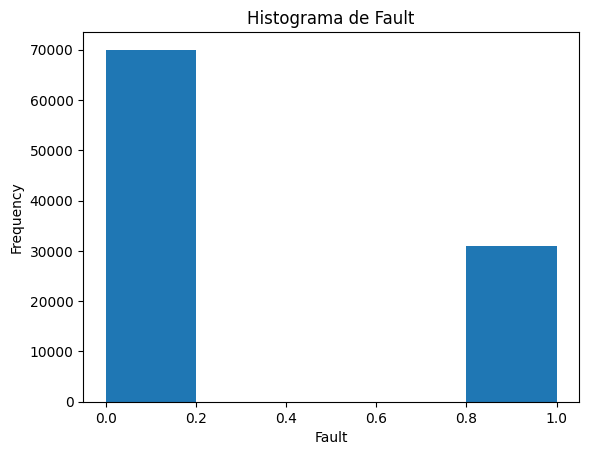

In [142]:
new_df['Fault'].plot.hist(bins=5)
plt.title('Histograma de Fault')
plt.xlabel('Fault')
plt.show()

In [143]:
print("Proporciones de Fault:")
print(new_df['Fault'].value_counts(normalize=True))

Proporciones de Fault:
Fault
0.0    0.693069
1.0    0.306931
Name: proportion, dtype: float64


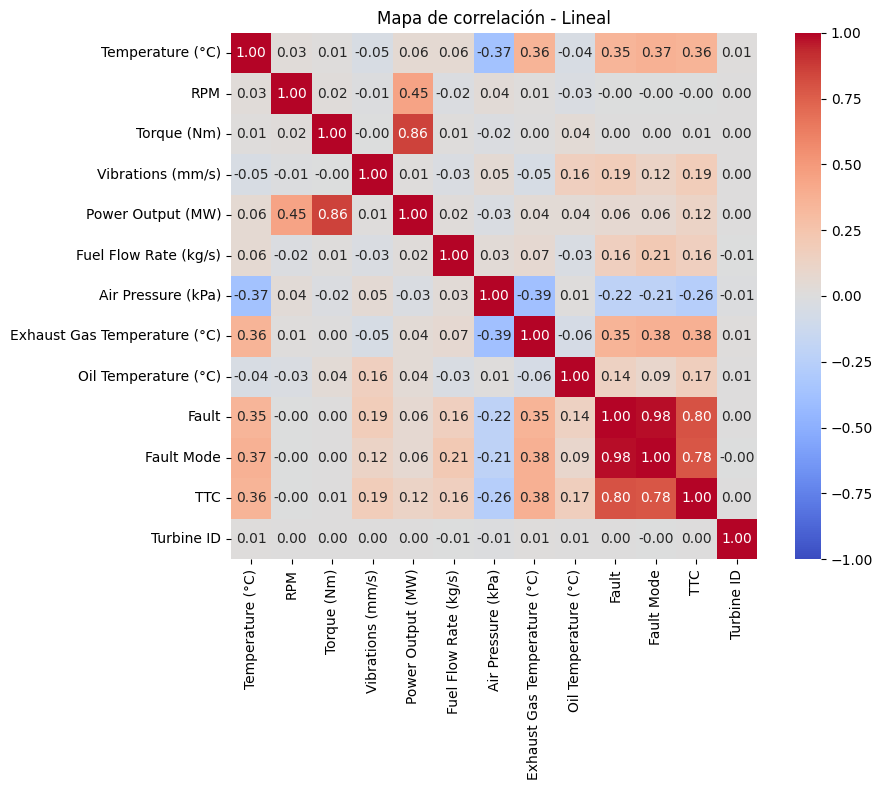

In [144]:
plt.figure(figsize=(10,8))
sns.heatmap(new_df.corr(method='spearman'), 
            cmap='coolwarm', 
            center=0,
            vmin=-1,    
            vmax=1,     
            annot=True,  
            fmt=".2f",   
            square=True) 
plt.title('Mapa de correlación - Lineal')
plt.tight_layout()
plt.show()

In [145]:
new_df.describe()

,Temperature (°C),RPM,Torque (Nm),Vibrations (mm/s),Power Output (MW),Fuel Flow Rate (kg/s),Air Pressure (kPa),Exhaust Gas Temperature (°C),Oil Temperature (°C),Fault,Fault Mode,TTC,Turbine ID
count,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000,101000.000000
mean,934.766827,15027.674805,3495.322450,2.266010,7754.838275,2.698206,127.034010,524.426438,122.011407,0.306931,0.615089,50.000000,500.500000
std,85.998026,501.448514,221.347964,1.363043,952.677698,1.168549,67.559890,69.486810,11.231215,0.461223,1.029242,29.154904,288.676419
min,735.544252,13475.030465,2526.988233,-3.354802,69.061693,-2.481370,-268.233109,379.401272,84.697353,0.000000,0.000000,0.000000,1.000000
25%,882.880056,14686.950127,3346.490639,1.355200,7422.919928,1.909276,124.668699,484.993847,114.699975,0.000000,0.000000,25.000000,250.750000
50%,919.884566,15016.153785,3494.126742,2.165451,7818.953701,2.655117,145.184147,508.859544,121.592793,0.000000,0.000000,50.000000,500.500000
75%,964.580663,15364.141371,3642.163636,3.038485,8221.415548,3.428106,160.350974,537.848425,128.920672,1.000000,1.000000,75.000000,750.250000
max,1436.932748,16612.953571,4494.000362,9.900629,10607.309428,8.876661,215.888080,951.799529,185.695302,1.000000,3.000000,100.000000,1000.000000


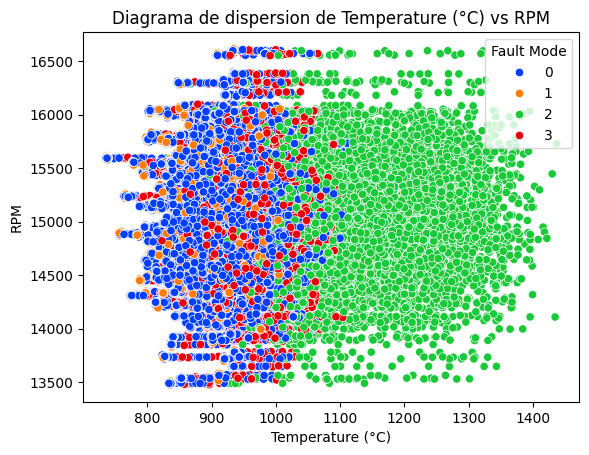

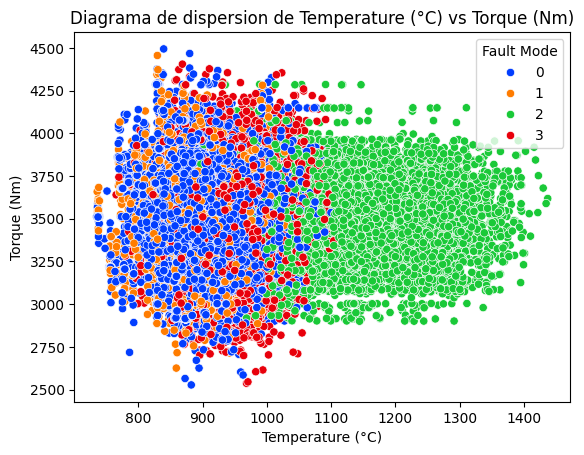

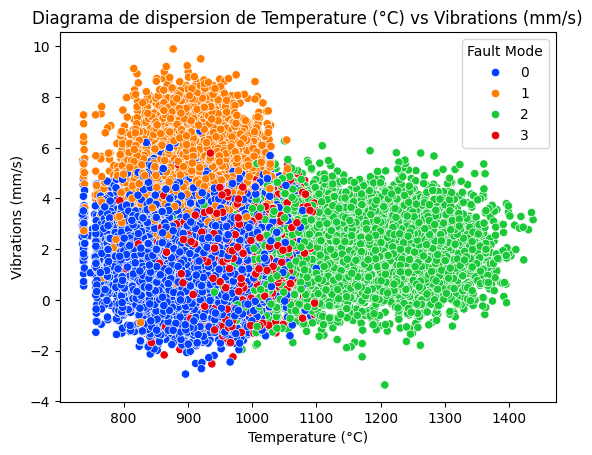

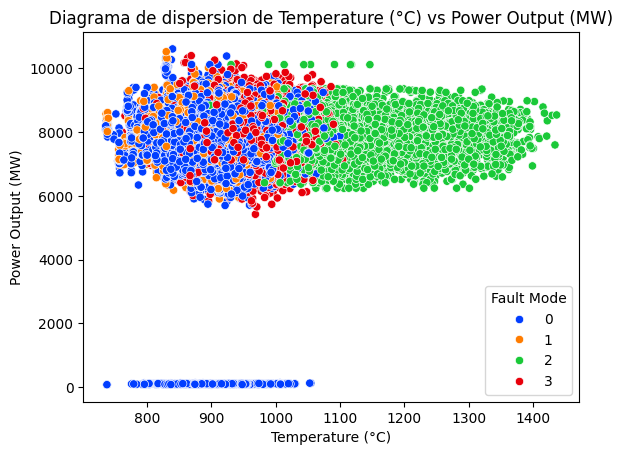

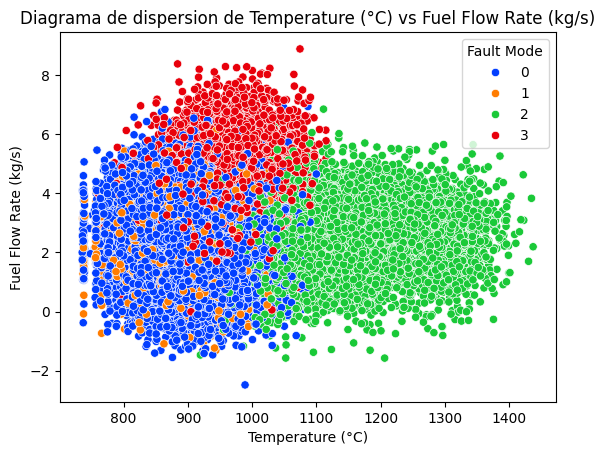

...

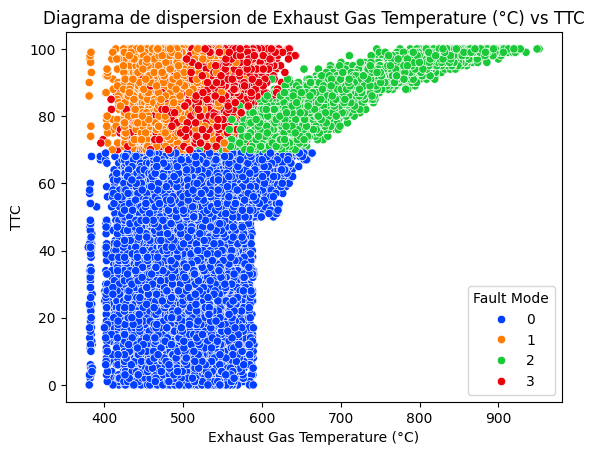

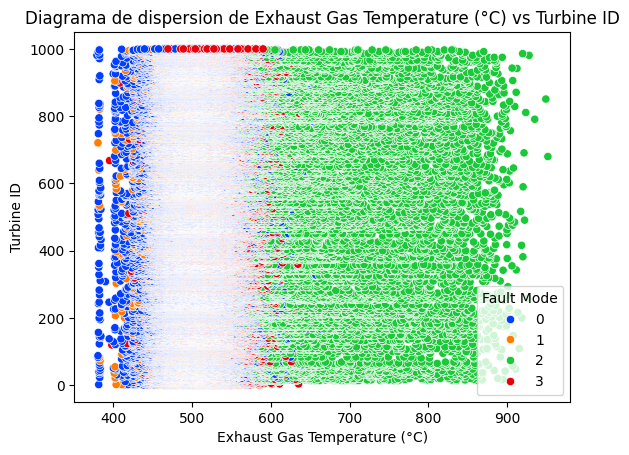

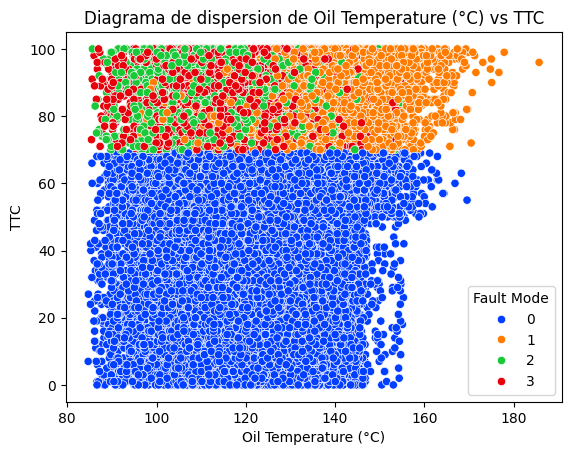

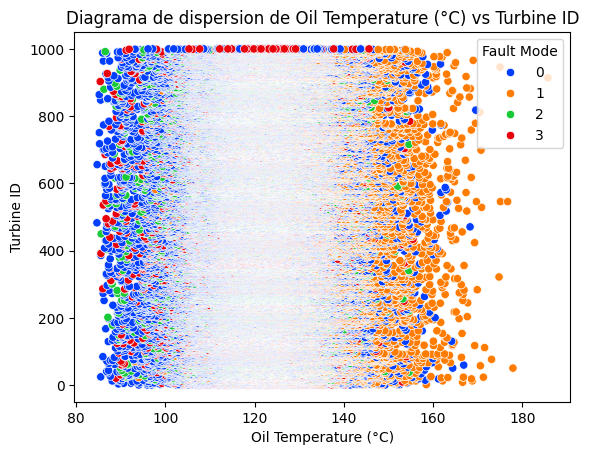

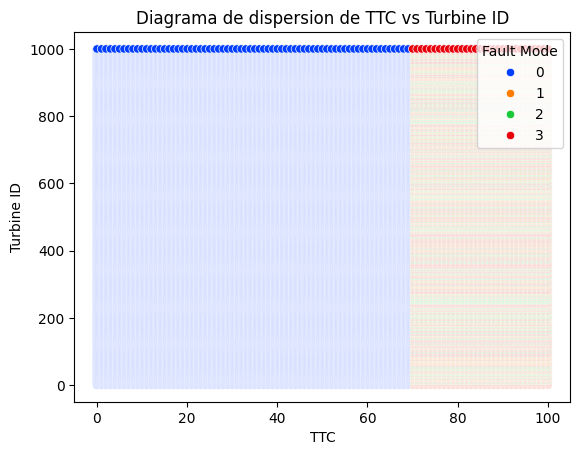

In [146]:
pair_visited = []

for col1 in new_df:
    for col2 in new_df:
        if col1 == col2 or pair_visited.__contains__((col1, col2)) or pair_visited.__contains__((col2, col1)) or col1 == "Fault" or col1 == "Fault Mode" or col2 == "Fault" or col2 == "Fault Mode":
            continue

        sns.scatterplot(data=new_df, x=col1, y=col2, hue='Fault Mode', palette='bright')
        plt.title(f'Diagrama de dispersion de {col1} vs {col2}')
        plt.xlabel(f"{col1}")
        plt.ylabel(f"{col2}")
        plt.show()

        pair_visited.append((col1, col2))

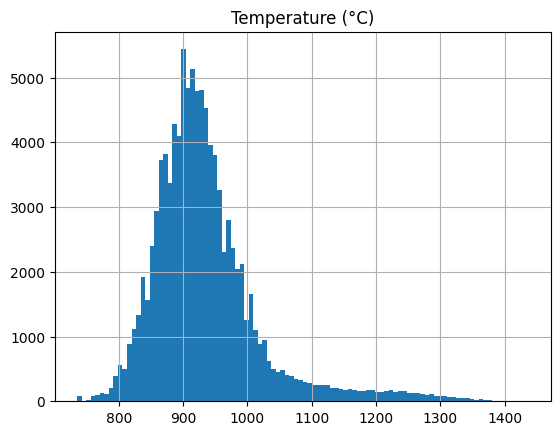

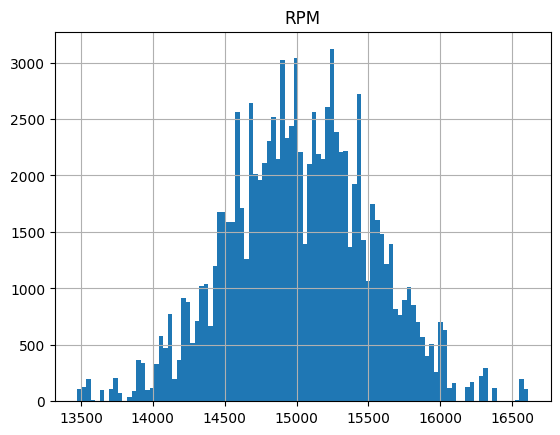

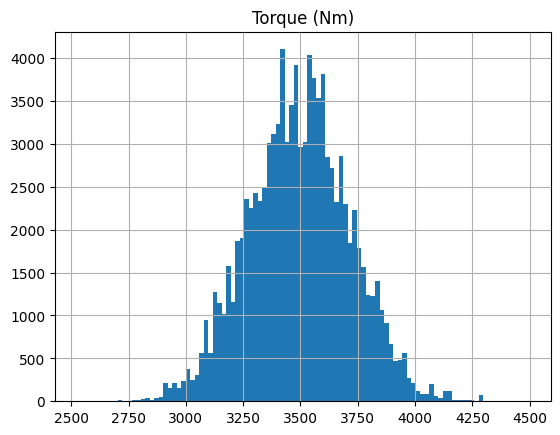

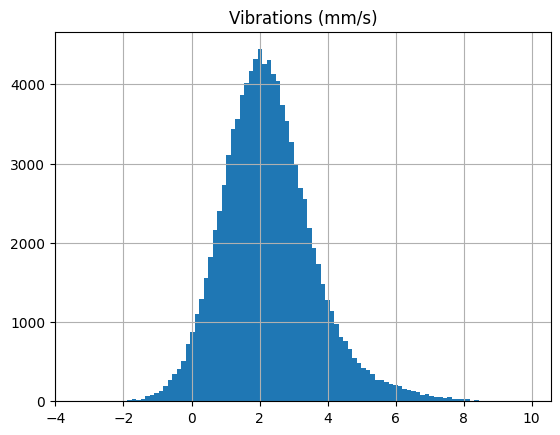

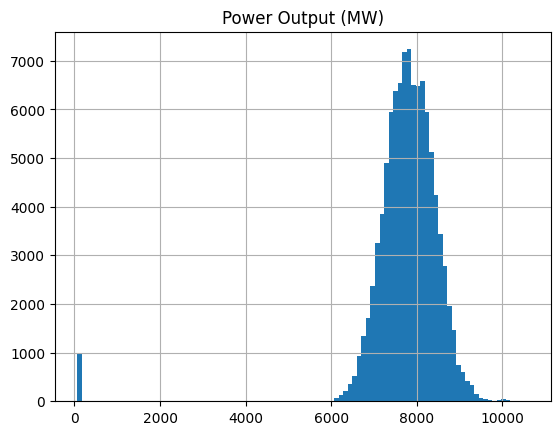

...

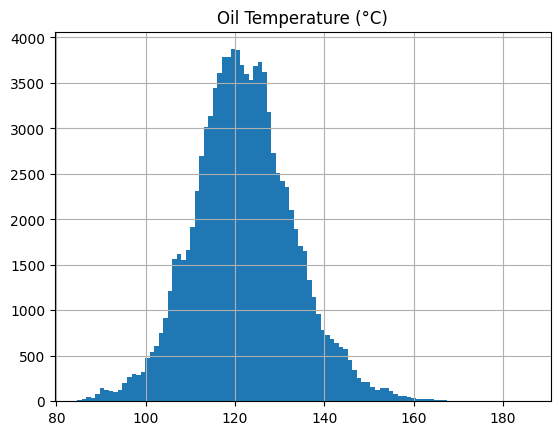

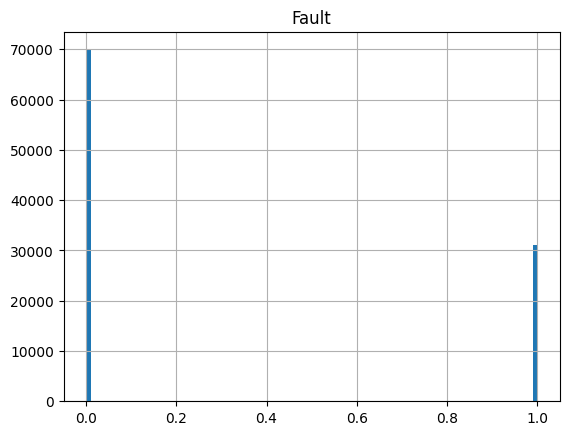

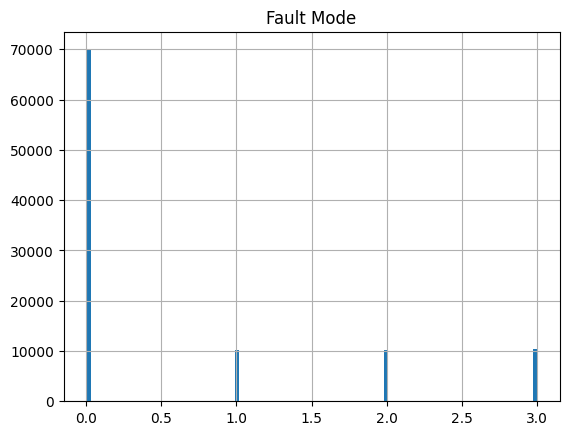

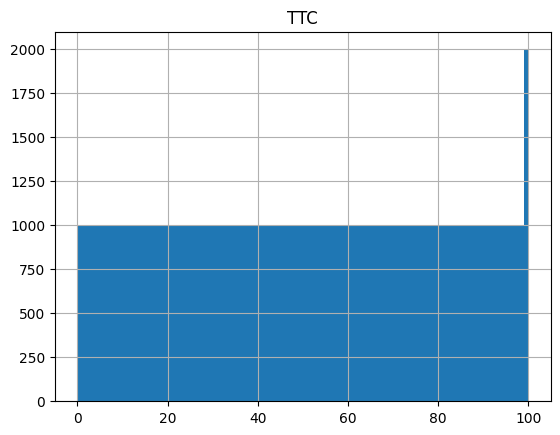

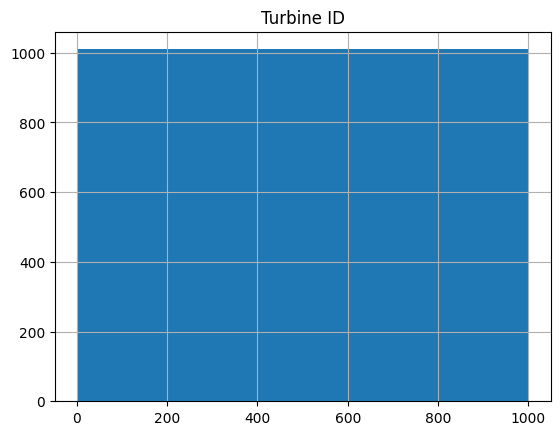

In [147]:
for col in new_df.columns:
    new_df.hist(col, bins=100)
